# OMNet-V2: Transfer-Learning Framework for Breast Cancer Histopathology Classification

**OMNet-V2** extends OMNet-V1 (custom CNN trained from scratch) with **ImageNet-pretrained transfer-learning backbones** (EfficientNet-B0 and ViT-B/16), **5-fold patient-level stratified cross-validation**, **minority-class oversampling**, and **dual interpretability (Grad-CAM + Score-CAM)** on the **BreakHis 200X** dataset (benign vs. malignant).

---

## Research Motivation & Gap Analysis

This notebook is built following the research benchmarks of **Jahan et al., "Deep learning and vision transformers-based framework for breast cancer and subtype identification"** (*Neural Computing and Applications*, 2025, [doi:10.1007/s00521-025-10984-2](https://doi.org/10.1007/s00521-025-10984-2)).

**Key Findings from Literature:**
- **Vision Transformers:** Global self-attention representations achieve superior classification metrics over standard CNN baselines.
- **Ensemble Synergy:** Combining CNN and ViT predictions via probability averaging outperforms individual models.
- **Explainability:** Score-CAM complements Grad-CAM, offering gradient-free attribution maps that are robust to gradient saturation.
- **Transfer Learning Advantage:** Pretrained representations are critical on medical histopathology datasets of modest size (~2,000 images at 200X) compared to small from-scratch CNNs.

## OMNet-V2 Architecture & Strategy

| Component | OMNet-V1 | OMNet-V2 (This Notebook) |
|---|---|---|
| Backbone Architectures | Small custom 4-block CNN (from scratch) | **EfficientNet-B0** + **ViT-B/16** (ImageNet-pretrained) |
| Ensemble Evaluation | None | **Probability Averaging Ensemble** (EfficientNet-B0 + ViT-B/16) |
| Validation Protocol | Single train/val/test split | **5-Fold Patient-Stratified Cross-Validation** + Held-Out Test Set |
| Class Imbalance | Loss weighting only | **WeightedRandomSampler** + Class-Weighted Loss |
| Interpretability | Grad-CAM only | **Grad-CAM (CNN)** + **Score-CAM (CNN & ViT with token reshape)** |
| Storage & Execution | Drive I/O bottlenecks | **Direct Fast SSD Cache Fetching** + Drive Checkpoints (`output_v2`) |

**Evaluation Protocol:**
1. 5-Fold Stratified Cross-Validation over the train+val pool for robust variance estimation.
2. Final 2-phase refit (head warmup followed by backbone fine-tuning) on the pool.
3. Strict one-time evaluation on the held-out patient-level test set.

# Section 1: Environment Setup

In [ ]:
# ============================================================
# Section 1: Environment Setup
# ============================================================
# Install packages not pre-installed on Colab
!pip install -q kagglehub grad-cam scikit-learn seaborn tqdm

# --- Standard Library ---
import os
import sys
import json
import time
import random
import warnings
import gc
import zipfile
import shutil
import glob
from pathlib import Path
from datetime import datetime, timedelta
from collections import Counter, OrderedDict

# --- Scientific Computing ---
import numpy as np
import pandas as pd

# --- Visualization ---
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

# --- Image Processing ---
from PIL import Image

# --- Progress Bars ---
from tqdm.auto import tqdm

# --- PyTorch ---
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler, Subset
from torchvision import transforms
import torchvision.models as tvm

# --- Metrics & Split ---
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, average_precision_score, balanced_accuracy_score,
    matthews_corrcoef, confusion_matrix, classification_report,
    roc_curve, precision_recall_curve
)
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.manifold import TSNE

# --- Suppress Warnings ---
warnings.filterwarnings('ignore')

# --- Plotting Style ---
plt.rcParams.update({
    'figure.figsize': (10, 6),
    'figure.dpi': 100,
    'font.size': 12,
    'axes.titlesize': 14,
    'axes.labelsize': 12,
    'axes.grid': True,
    'grid.alpha': 0.3,
    'lines.linewidth': 2,
})
sns.set_theme(style='whitegrid', palette='husl')

# --- Reproducibility ---
def set_seed(seed=42):
    random.seed(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False
    os.environ['PYTHONHASHSEED'] = str(seed)

set_seed(42)

print("=" * 60)
print("  OMNet-V2 Environment Setup Complete")
print("=" * 60)
print(f"  PyTorch     : {torch.__version__}")
print(f"  Torchvision : {tvm.__version__ if hasattr(tvm, '__version__') else __import__('torchvision').__version__}")
print(f"  Python      : {sys.version.split()[0]}")
print(f"  NumPy       : {np.__version__}")
print(f"  Pandas      : {pd.__version__}")
print(f"  CUDA Avail  : {torch.cuda.is_available()}")
print("=" * 60)

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 111.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  OMNet-V2 Environment Setup Complete
  PyTorch     : 2.11.0+cu128
  Torchvision : 0.26.0+cu128
  Python      : 3.12.13
  NumPy       : 2.0.2
  Pandas      : 2.2.2
  CUDA Avail  : True


# Section 2: GPU Detection

In [ ]:
# ============================================================
# Section 2: GPU Detection
# ============================================================
DEVICE = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

print("=" * 60)
print("  Hardware Configuration")
print("=" * 60)
if torch.cuda.is_available():
    props = torch.cuda.get_device_properties(0)
    print(f"  Device         : {torch.cuda.get_device_name(0)}")
    print(f"  Compute Cap.   : {props.major}.{props.minor}")
    print(f"  Total Memory   : {props.total_memory / 1e9:.2f} GB")
    print(f"  Multiprocessors: {props.multi_processor_count}")
else:
    print("  [WARNING] No GPU detected. Execution will proceed on CPU.")
print(f"  Active Device  : {DEVICE}")
print("=" * 60)

  Hardware Configuration
  Device         : Tesla T4
  Compute Cap.   : 7.5
  Total Memory   : 15.64 GB
  Multiprocessors: 40
  Active Device  : cuda


# Section 3: Kaggle Authentication & Google Drive Mount

In [ ]:
# ============================================================
# Section 3: Kaggle Authentication & Google Drive Mount
# ============================================================
# Kaggle API Authentication Token
os.environ["KAGGLE_API_TOKEN"] = "KGAT_18c71d28310cd8321b7765aaceb54d3e"
os.makedirs(os.path.expanduser("~/.kaggle"), exist_ok=True)

IN_COLAB = 'google.colab' in sys.modules

if IN_COLAB:
    from google.colab import drive
    drive.mount('/content/drive')
    OUTPUT_DIR = Path('/content/drive/MyDrive/output_v2')
else:
    OUTPUT_DIR = Path('./output_v2')

PROJECT_ROOT = OUTPUT_DIR

# --- Output subdirectories ---
GRADCAM_DIR = OUTPUT_DIR / 'gradcam'
SCORECAM_DIR = OUTPUT_DIR / 'scorecam'
MISCLASSIFIED_DIR = OUTPUT_DIR / 'misclassified'
CORRECT_PRED_DIR = OUTPUT_DIR / 'correct_predictions'

for d in [OUTPUT_DIR, GRADCAM_DIR, SCORECAM_DIR, MISCLASSIFIED_DIR, CORRECT_PRED_DIR]:
    d.mkdir(parents=True, exist_ok=True)

print("=" * 60)
print("  Storage & Authentication Configuration")
print("=" * 60)
print(f"  Environment  : {'Google Colab' if IN_COLAB else 'Local Machine'}")
print(f"  Output Dir   : {OUTPUT_DIR}")
print(f"  Kaggle Auth  : KAGGLE_API_TOKEN active")
print("=" * 60)

def save_figure(fig, filename, dpi=150):
    path = OUTPUT_DIR / filename
    fig.savefig(path, dpi=dpi, bbox_inches='tight', facecolor='white')
    print(f"  [SAVE] Saved: {path}")

Mounted at /content/drive
  Storage & Authentication Configuration
  Environment  : Google Colab
  Output Dir   : /content/drive/MyDrive/output_v2
  Kaggle Auth  : KAGGLE_API_TOKEN active


# Centralized Configuration

In [ ]:
# ============================================================
# IMPORTANT: All configurable hyperparameters are centralized
# here. Modify ONLY this cell to change the experiment
# configuration, ensuring reproducibility and consistency.
# ============================================================

CONFIG = {
    # --- Data ---
    "data": {
        "dataset_id": "trexbytes/breakhislink",
        "magnification": "200X",
        "input_size": 224,
        "batch_size": 16,
        "num_workers": 0,
        "pin_memory": True,
    },
    # --- Model ---
    "model": {
        "backbones": ["efficientnet_b0", "vit_b_16"],
        "num_classes": 2,
        "embedding_dim": 256,
        "dropout": 0.4,
        "unfreeze_last_n_blocks": 2,
    },
    # --- Cross-Validation ---
    "cv": {
        "n_folds": 5,
        "epochs_per_fold": 6,
    },
    # --- Final Refit (2-phase: frozen warmup -> full fine-tune) ---
    "final": {
        "phase1_epochs": 3,
        "phase2_epochs": 12,
        "early_stopping_patience": 4,
    },
    # --- Optimizer ---
    "optim": {
        "lr_head": 1e-3,
        "lr_backbone": 1e-5,
        "weight_decay": 1e-4,
        "mixed_precision": True,
    },
    # --- Loss ---
    "loss": {
        "name": "cross_entropy",
        "focal_gamma": 2.0,
        "label_smoothing": 0.05,
        "use_oversampling": True,
    },
    # --- Normalization ---
    "normalization": "imagenet",
    # --- Reproducibility ---
    "seed": 42,
    # --- Smoke Test ---
    "smoke_test": False,
}

if CONFIG['smoke_test']:
    CONFIG['cv']['n_folds'] = 2
    CONFIG['cv']['epochs_per_fold'] = 1
    CONFIG['final']['phase1_epochs'] = 1
    CONFIG['final']['phase2_epochs'] = 1

# Apply seed
set_seed(CONFIG['seed'])

print("=" * 60)
print("  Experiment Configuration (OMNet-V2)")
print("=" * 60)
for section, params in CONFIG.items():
    if isinstance(params, dict):
        print(f"\n  [{section}]")
        for k, v in params.items():
            print(f"    {k:30s}: {v}")
    else:
        print(f"  {section:32s}: {params}")
print("\n" + "=" * 60)
if CONFIG['smoke_test']:
    print("  [INFO] SMOKE TEST MODE: folds and epochs reduced for quick testing.")
else:
    print("  [INFO] FULL TRAINING MODE: 5-Fold Stratified CV + Final Refit active.")
print("=" * 60)

  Experiment Configuration (OMNet-V2)

  [data]
    dataset_id                    : trexbytes/breakhislink
    magnification                 : 200X
    input_size                    : 224
    batch_size                    : 16
    num_workers                   : 0
    pin_memory                    : True

  [model]
    backbones                     : ['efficientnet_b0', 'vit_b_16']
    num_classes                   : 2
    embedding_dim                 : 256
    dropout                       : 0.4
    unfreeze_last_n_blocks        : 2

  [cv]
    n_folds                       : 5
    epochs_per_fold               : 6

  [final]
    phase1_epochs                 : 3
    phase2_epochs                 : 12
    early_stopping_patience       : 4

  [optim]
    lr_head                       : 0.001
    lr_backbone                   : 1e-05
    weight_decay                  : 0.0001
    mixed_precision               : True

  [loss]
    name                          : cross_entropy
    focal_

# Section 4: Dataset Download & Audit via kagglehub

In [ ]:
# ============================================================
# Section 4: Dataset Download & Audit via kagglehub
# ============================================================
import kagglehub

dataset_id = CONFIG['data']['dataset_id']
target_mag = CONFIG['data']['magnification']

print(f"[INFO] Fetching dataset '{dataset_id}' directly via kagglehub...")
download_path = kagglehub.dataset_download(dataset_id)
print(f"[INFO] Download path: {download_path}")

# Check for zip archives in download path and extract locally to fast SSD cache if needed
local_extract_dir = Path('./data_breakhis')
zip_files = glob.glob(os.path.join(download_path, '**', '*.zip'), recursive=True)

if zip_files:
    os.makedirs(local_extract_dir, exist_ok=True)
    for zf in zip_files:
        print(f"[INFO] Extracting archive {zf} to {local_extract_dir}...")
        with zipfile.ZipFile(zf, 'r') as z:
            z.extractall(local_extract_dir)
    search_root = local_extract_dir
else:
    search_root = Path(download_path)

print(f"[INFO] Searching for {target_mag} PNG images in {search_root}...")
all_pngs = glob.glob(os.path.join(str(search_root), '**', '*.png'), recursive=True)
print(f"[INFO] Total PNG files found across all magnifications: {len(all_pngs)}")

# Subtype mappings
SUBTYPE_FOLDERS = {
    'adenosis', 'fibroadenoma', 'phyllodes_tumor', 'tubular_adenoma',
    'ductal_carcinoma', 'lobular_carcinoma', 'mucinous_carcinoma', 'papillary_carcinoma'
}
SUBTYPE_CODE_MAP = {
    'A': 'adenosis', 'F': 'fibroadenoma', 'PT': 'phyllodes_tumor', 'TA': 'tubular_adenoma',
    'DC': 'ductal_carcinoma', 'LC': 'lobular_carcinoma', 'MC': 'mucinous_carcinoma', 'PC': 'papillary_carcinoma'
}
PRIMARY_FROM_SUBTYPE = {
    'adenosis': 'benign', 'fibroadenoma': 'benign', 'phyllodes_tumor': 'benign', 'tubular_adenoma': 'benign',
    'ductal_carcinoma': 'malignant', 'lobular_carcinoma': 'malignant', 'mucinous_carcinoma': 'malignant', 'papillary_carcinoma': 'malignant'
}

records = []
parse_errors = []

for img_path in all_pngs:
    path_norm = img_path.replace('\\', '/')
    fname = os.path.basename(img_path)
    fname_no_ext = fname.replace('.png', '')

    # Filter for target magnification (200X)
    is_target_mag = (f'/{target_mag}/' in path_norm) or (f'-{target_mag.replace("X","")}-' in fname)
    if not is_target_mag:
        continue

    # Determine subtype
    subtype = None
    path_lower = path_norm.lower()
    for st in SUBTYPE_FOLDERS:
        if f'/{st}/' in path_lower:
            subtype = st
            break

    if subtype is None:
        prefix = fname_no_ext.split('-')[0]
        parts = prefix.split('_')
        if len(parts) >= 3:
            code_str = '_'.join(parts[2:])
            subtype = SUBTYPE_CODE_MAP.get(code_str)

    if subtype is None:
        parse_errors.append(f"Could not parse subtype: {img_path}")
        continue

    primary = PRIMARY_FROM_SUBTYPE[subtype]

    # Extract patient/case ID
    parts = fname_no_ext.split('-')
    if len(parts) >= 4:
        case_id = '-'.join(parts[1:-2])
        subtype_prefix = parts[0].split('_')[-1]
        patient_id = f"{subtype_prefix}_{case_id}"
    else:
        patient_id = fname_no_ext
        parse_errors.append(f"Unexpected filename format: {fname}")

    records.append({
        'filepath': img_path,
        'filename': fname,
        'patient_id': patient_id,
        'magnification': target_mag,
        'primary_label': primary,
        'subtype_label': subtype,
        'label': 0 if primary == 'benign' else 1,
    })

if parse_errors:
    print(f"[WARNING] Parse warnings: {len(parse_errors)} items")
    for err in parse_errors[:3]:
        print(f"  {err}")

audit_df = pd.DataFrame(records)
assert len(audit_df) > 0, "[ERROR] No valid 200X records found after parsing!"

print(f"[OK] Audit complete: {len(audit_df)} images found for {target_mag} from {audit_df['patient_id'].nunique()} unique patients.")

[INFO] Fetching dataset 'trexbytes/breakhislink' directly via kagglehub...


100%|██████████| 3.98G/3.98G [03:23<00:00, 21.1MB/s]

Extracting files...


[INFO] Download path: /root/.cache/kagglehub/datasets/trexbytes/breakhislink/versions/1
[INFO] Searching for 200X PNG images in /root/.cache/kagglehub/datasets/trexbytes/breakhislink/versions/1...
[INFO] Total PNG files found across all magnifications: 7909
[OK] Audit complete: 2013 images found for 200X from 82 unique patients.


# Section 5: Patient-Level Stratified Split & Leakage Verification

In [ ]:
# ============================================================
# Section 5: Patient-Level Stratified Split & Leakage Verification
# ============================================================
print("=" * 60)
print("  PATIENT-LEVEL STRATIFIED SPLIT")
print("=" * 60)

SPLIT_CSV_PATH = OUTPUT_DIR / "split.csv"
ALT_SPLIT_CSV_PATH = Path("/content/drive/MyDrive/output_CNN/split.csv")

patient_info = audit_df.groupby('patient_id').agg({
    'subtype_label': 'first',
    'primary_label': 'first',
    'filepath': 'count'
}).rename(columns={'filepath': 'num_images'}).reset_index()

print(f"Total unique patients: {len(patient_info)}")

_reuse_split = False
target_split_path = None

if SPLIT_CSV_PATH.exists():
    target_split_path = SPLIT_CSV_PATH
elif ALT_SPLIT_CSV_PATH.exists():
    target_split_path = ALT_SPLIT_CSV_PATH

if target_split_path is not None:
    print(f"[INFO] Checking existing split file at: {target_split_path}")
    existing_split = pd.read_csv(target_split_path)
    existing_patients = set(existing_split['patient_id'].unique())
    current_patients = set(patient_info['patient_id'].unique())
    if current_patients.issubset(existing_patients) or len(current_patients & existing_patients) > 0.8 * len(current_patients):
        print("[INFO] Reusing existing patient-level split for continuity.")
        pat_to_split = dict(zip(existing_split['patient_id'], existing_split['split']))
        audit_df['split'] = audit_df['patient_id'].map(pat_to_split).fillna('train')
        split_df = audit_df.copy()
        _reuse_split = True

if not _reuse_split:
    print("[INFO] Generating new patient-level stratified split (70/15/15)...")
    patients = patient_info['patient_id'].values
    subtypes = patient_info['subtype_label'].values

    # Step 1: 85% trainval, 15% test
    try:
        patients_trainval, patients_test = train_test_split(
            patients, test_size=0.15, random_state=CONFIG['seed'], stratify=subtypes
        )
    except Exception:
        patients_trainval, patients_test = train_test_split(
            patients, test_size=0.15, random_state=CONFIG['seed']
        )

    # Step 2: 70% train (82.35% of trainval), 15% val (17.65% of trainval)
    trainval_mask = patient_info['patient_id'].isin(patients_trainval)
    trainval_subtypes = patient_info[trainval_mask]['subtype_label'].values
    trainval_patients = patient_info[trainval_mask]['patient_id'].values

    try:
        patients_train, patients_val = train_test_split(
            trainval_patients, test_size=15/85, random_state=CONFIG['seed'], stratify=trainval_subtypes
        )
    except Exception:
        patients_train, patients_val = train_test_split(
            trainval_patients, test_size=15/85, random_state=CONFIG['seed']
        )

    train_set = set(patients_train)
    val_set = set(patients_val)
    test_set = set(patients_test)

    audit_df['split'] = audit_df['patient_id'].apply(
        lambda pid: 'train' if pid in train_set else ('val' if pid in val_set else 'test')
    )
    split_df = audit_df.copy()

# Save split to output_v2
split_df[['filepath', 'patient_id', 'magnification', 'primary_label', 'subtype_label', 'split']].to_csv(
    SPLIT_CSV_PATH, index=False
)
print(f"[OK] Split saved to: {SPLIT_CSV_PATH}")

# Verify no patient overlap across splits
train_patients = set(split_df[split_df['split'] == 'train']['patient_id'])
val_patients = set(split_df[split_df['split'] == 'val']['patient_id'])
test_patients = set(split_df[split_df['split'] == 'test']['patient_id'])

assert len(train_patients & val_patients) == 0, "[ERROR] Patient leak between train and val!"
assert len(train_patients & test_patients) == 0, "[ERROR] Patient leak between train and test!"
assert len(val_patients & test_patients) == 0, "[ERROR] Patient leak between val and test!"
print("[OK] Zero patient overlap verified across all splits.")

# Setup paths and labels for CV pool and test set
train_df = split_df[split_df['split'] == 'train']
val_df = split_df[split_df['split'] == 'val']
test_df = split_df[split_df['split'] == 'test']
pool_df = split_df[split_df['split'].isin(['train', 'val'])].reset_index(drop=True)

POOL_PATHS = pool_df['filepath'].values
POOL_LABELS = pool_df['label'].values
POOL_PATIENTS = pool_df['patient_id'].values

test_paths = test_df['filepath'].values
test_labels = test_df['label'].values

print(f"[INFO] Train split   : {len(train_df)} images ({train_df['patient_id'].nunique()} patients)")
print(f"[INFO] Val split     : {len(val_df)} images ({val_df['patient_id'].nunique()} patients)")
print(f"[INFO] Held-out Test : {len(test_df)} images ({test_df['patient_id'].nunique()} patients)")
print(f"[INFO] CV Pool Total : {len(pool_df)} images ({pool_df['patient_id'].nunique()} patients)")

  PATIENT-LEVEL STRATIFIED SPLIT
Total unique patients: 82
[INFO] Checking existing split file at: /content/drive/MyDrive/output_v2/split.csv
[INFO] Reusing existing patient-level split for continuity.
[OK] Split saved to: /content/drive/MyDrive/output_v2/split.csv
[OK] Zero patient overlap verified across all splits.
[INFO] Train split   : 1444 images (56 patients)
[INFO] Val split     : 289 images (13 patients)
[INFO] Held-out Test : 280 images (13 patients)
[INFO] CV Pool Total : 1733 images (69 patients)


# Section 6: Dataset Analysis & Visualization

  Dataset Composition (BreakHis 200X)
              Split  Benign  Malignant  Total  Malignant %
              Train     432       1012   1444         70.1
                Val     107        182    289         63.0
               Test      84        196    280         70.0
CV Pool (Train+Val)     539       1194   1733         68.9
  [SAVE] Saved: /content/drive/MyDrive/output_v2/dataset_composition.png


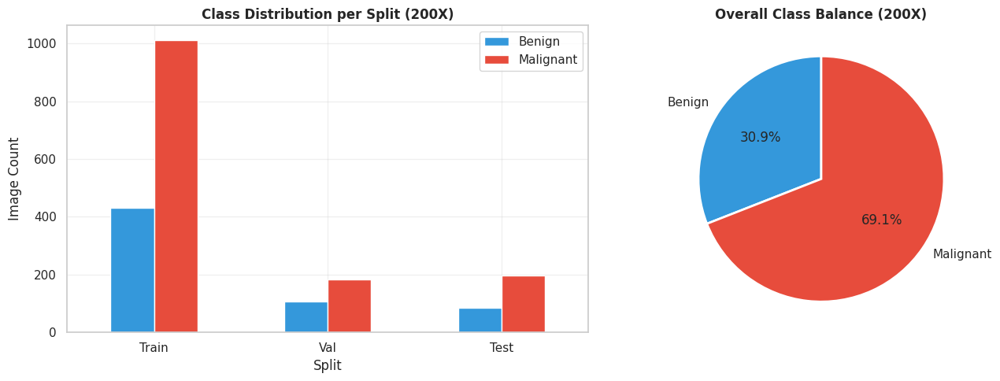

  [SAVE] Saved: /content/drive/MyDrive/output_v2/sample_images.png


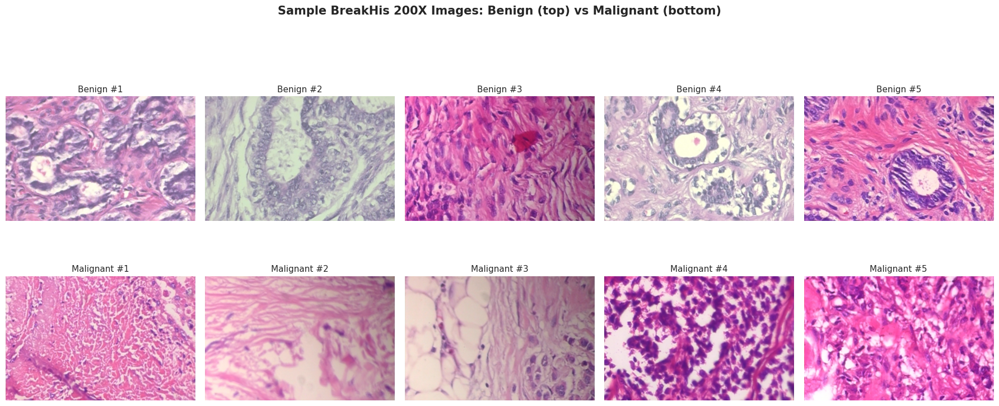

In [ ]:
# ============================================================
# Section 6: Dataset Analysis & Visualization
# ============================================================
CLASS_NAMES = ['benign', 'malignant']

counts_df = pd.DataFrame({
    'Split': ['Train', 'Val', 'Test', 'CV Pool (Train+Val)'],
    'Benign': [
        (train_df['label'] == 0).sum(),
        (val_df['label'] == 0).sum(),
        (test_df['label'] == 0).sum(),
        (pool_df['label'] == 0).sum(),
    ],
    'Malignant': [
        (train_df['label'] == 1).sum(),
        (val_df['label'] == 1).sum(),
        (test_df['label'] == 1).sum(),
        (pool_df['label'] == 1).sum(),
    ],
})
counts_df['Total'] = counts_df['Benign'] + counts_df['Malignant']
counts_df['Malignant %'] = (counts_df['Malignant'] / counts_df['Total'] * 100).round(1)

print("=" * 60)
print("  Dataset Composition (BreakHis 200X)")
print("=" * 60)
print(counts_df.to_string(index=False))
print("=" * 60)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
counts_df.set_index('Split')[['Benign', 'Malignant']].iloc[:3].plot(
    kind='bar', ax=axes[0], color=['#3498db', '#e74c3c'])
axes[0].set_title('Class Distribution per Split (200X)', fontweight='bold')
axes[0].set_ylabel('Image Count')
axes[0].tick_params(axis='x', rotation=0)

overall_benign = (split_df['label'] == 0).sum()
overall_malignant = (split_df['label'] == 1).sum()
axes[1].pie(
    [overall_benign, overall_malignant], labels=['Benign', 'Malignant'],
    autopct='%1.1f%%', colors=['#3498db', '#e74c3c'], startangle=90,
    wedgeprops={'edgecolor': 'white', 'linewidth': 2}
)
axes[1].set_title('Overall Class Balance (200X)', fontweight='bold')

plt.tight_layout()
save_figure(fig, 'dataset_composition.png')
plt.show()

# Sample image grid
fig, axes = plt.subplots(2, 5, figsize=(18, 8))
for col in range(5):
    for row, (cls_idx, cls_name) in enumerate(zip([0, 1], CLASS_NAMES)):
        cls_paths = train_df[train_df['label'] == cls_idx]['filepath'].values
        img_path = random.choice(cls_paths)
        img = Image.open(img_path).convert('RGB')
        axes[row, col].imshow(img)
        axes[row, col].axis('off')
        if col == 0:
            axes[row, col].set_ylabel(cls_name.capitalize(), fontsize=14)
        axes[row, col].set_title(f'{cls_name.capitalize()} #{col+1}', fontsize=11)

fig.suptitle('Sample BreakHis 200X Images: Benign (top) vs Malignant (bottom)', fontsize=15, fontweight='bold', y=1.02)
plt.tight_layout()
save_figure(fig, 'sample_images.png')
plt.show()

# Section 7: Normalization Statistics

In [ ]:
# ============================================================
# Section 7: Normalization Statistics
# ============================================================
to_tensor = transforms.ToTensor()
pixel_sum = torch.zeros(3, dtype=torch.float64)
pixel_sq_sum = torch.zeros(3, dtype=torch.float64)
total_pixels = 0

train_paths = train_df['filepath'].values
sample_paths = train_paths if not CONFIG['smoke_test'] else train_paths[:100]

for img_path in tqdm(sample_paths, desc='Computing dataset normalization stats'):
    img = Image.open(img_path).convert('RGB')
    tensor = to_tensor(img)
    pixel_sum += tensor.sum(dim=[1, 2]).double()
    pixel_sq_sum += (tensor ** 2).sum(dim=[1, 2]).double()
    total_pixels += tensor.shape[1] * tensor.shape[2]

DATASET_MEAN = (pixel_sum / total_pixels).float().tolist()
DATASET_STD = torch.sqrt(pixel_sq_sum / total_pixels - (pixel_sum / total_pixels) ** 2).float().tolist()
IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD = [0.229, 0.224, 0.225]

if CONFIG['normalization'] == 'dataset':
    NORM_MEAN, NORM_STD, norm_source = DATASET_MEAN, DATASET_STD, 'Dataset-specific'
else:
    NORM_MEAN, NORM_STD, norm_source = IMAGENET_MEAN, IMAGENET_STD, 'ImageNet (matches pretrained backbones)'

print("=" * 60)
print("  Normalization Statistics")
print("=" * 60)
print(f"  Dataset Mean  : {[round(v, 4) for v in DATASET_MEAN]}")
print(f"  Dataset Std   : {[round(v, 4) for v in DATASET_STD]}")
print(f"  ImageNet Mean : {IMAGENET_MEAN}")
print(f"  ImageNet Std  : {IMAGENET_STD}")
print(f"  Active Policy : {norm_source}")
print("=" * 60)

Computing dataset normalization stats:   0%|          | 0/1444 [00:00<?, ?it/s]

  Normalization Statistics
  Dataset Mean  : [0.7851, 0.6189, 0.7606]
  Dataset Std   : [0.1291, 0.1842, 0.1105]
  ImageNet Mean : [0.485, 0.456, 0.406]
  ImageNet Std  : [0.229, 0.224, 0.225]
  Active Policy : ImageNet (matches pretrained backbones)


# Section 8: Datasets, Augmentations & Loaders

In [ ]:
# ============================================================
# Section 8: Datasets, Augmentations & Loaders
# ============================================================
IMG_SIZE = CONFIG['data']['input_size']

train_transform = transforms.Compose([
    transforms.RandomResizedCrop(IMG_SIZE, scale=(0.8, 1.0)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomVerticalFlip(p=0.5),
    transforms.RandomRotation(20),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.ToTensor(),
    transforms.Normalize(mean=NORM_MEAN, std=NORM_STD),
])

eval_transform = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=NORM_MEAN, std=NORM_STD),
])


class PatchDataset(Dataset):
    """Generic dataset mapping image paths and binary labels to transformed tensors."""
    def __init__(self, paths, labels, transform=None):
        self.paths = list(paths)
        self.labels = np.asarray(labels, dtype=np.int64)
        self.transform = transform

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        image = Image.open(self.paths[idx]).convert('RGB')
        label = int(self.labels[idx])
        if self.transform:
            image = self.transform(image)
        return image, label


def make_loader(paths, labels, transform, batch_size, shuffle=False, oversample=False, num_workers=0):
    """Builds a PyTorch DataLoader with num_workers=0 to prevent multiprocessing child-process issues."""
    ds = PatchDataset(paths, labels, transform=transform)
    nw = 0  # Locked to 0 per stability guidelines
    if oversample:
        counts = Counter(labels.tolist())
        sample_weights = np.array([1.0 / max(counts[l], 1) for l in labels])
        sampler = WeightedRandomSampler(sample_weights, num_samples=len(sample_weights), replacement=True)
        loader = DataLoader(ds, batch_size=batch_size, sampler=sampler, num_workers=nw,
                            pin_memory=CONFIG['data']['pin_memory'], drop_last=True)
    else:
        loader = DataLoader(ds, batch_size=batch_size, shuffle=shuffle, num_workers=nw,
                            pin_memory=CONFIG['data']['pin_memory'], drop_last=False)
    return ds, loader


def class_weights_from_labels(labels, device):
    counts = Counter(labels.tolist())
    total = len(labels)
    n_classes = len(counts)
    return torch.tensor([total / (n_classes * max(counts[i], 1)) for i in range(n_classes)],
                         dtype=torch.float32).to(device)


# 5-Fold Stratified Cross-Validation on the Pool
skf = StratifiedKFold(n_splits=CONFIG['cv']['n_folds'], shuffle=True, random_state=CONFIG['seed'])
CV_FOLDS = list(skf.split(POOL_PATHS, POOL_LABELS))

# Held-out test dataset/loader
test_dataset, test_loader = make_loader(
    test_paths, test_labels, eval_transform, CONFIG['data']['batch_size'], shuffle=False, num_workers=0
)

print("=" * 60)
print("  Cross-Validation & Test Loaders Setup")
print("=" * 60)
print(f"  CV Pool Size   : {len(POOL_PATHS)} images")
print(f"  Folds          : {CONFIG['cv']['n_folds']}")
for i, (tr_idx, va_idx) in enumerate(CV_FOLDS):
    tr_bal = Counter(POOL_LABELS[tr_idx].tolist())
    va_bal = Counter(POOL_LABELS[va_idx].tolist())
    print(f"    Fold {i+1}: train={len(tr_idx):4d} (B:{tr_bal.get(0,0)}, M:{tr_bal.get(1,0)}) | val={len(va_idx):4d} (B:{va_bal.get(0,0)}, M:{va_bal.get(1,0)})")
print(f"  Held-out Test  : {len(test_dataset)} images (untouched by CV)")
print("=" * 60)

  Cross-Validation & Test Loaders Setup
  CV Pool Size   : 1733 images
  Folds          : 5
    Fold 1: train=1386 (B:431, M:955) | val= 347 (B:108, M:239)
    Fold 2: train=1386 (B:431, M:955) | val= 347 (B:108, M:239)
    Fold 3: train=1386 (B:431, M:955) | val= 347 (B:108, M:239)
    Fold 4: train=1387 (B:432, M:955) | val= 346 (B:107, M:239)
    Fold 5: train=1387 (B:431, M:956) | val= 346 (B:108, M:238)
  Held-out Test  : 280 images (untouched by CV)


# Section 9: Data Augmentation Visualization

  [SAVE] Saved: /content/drive/MyDrive/output_v2/augmentation_examples.png


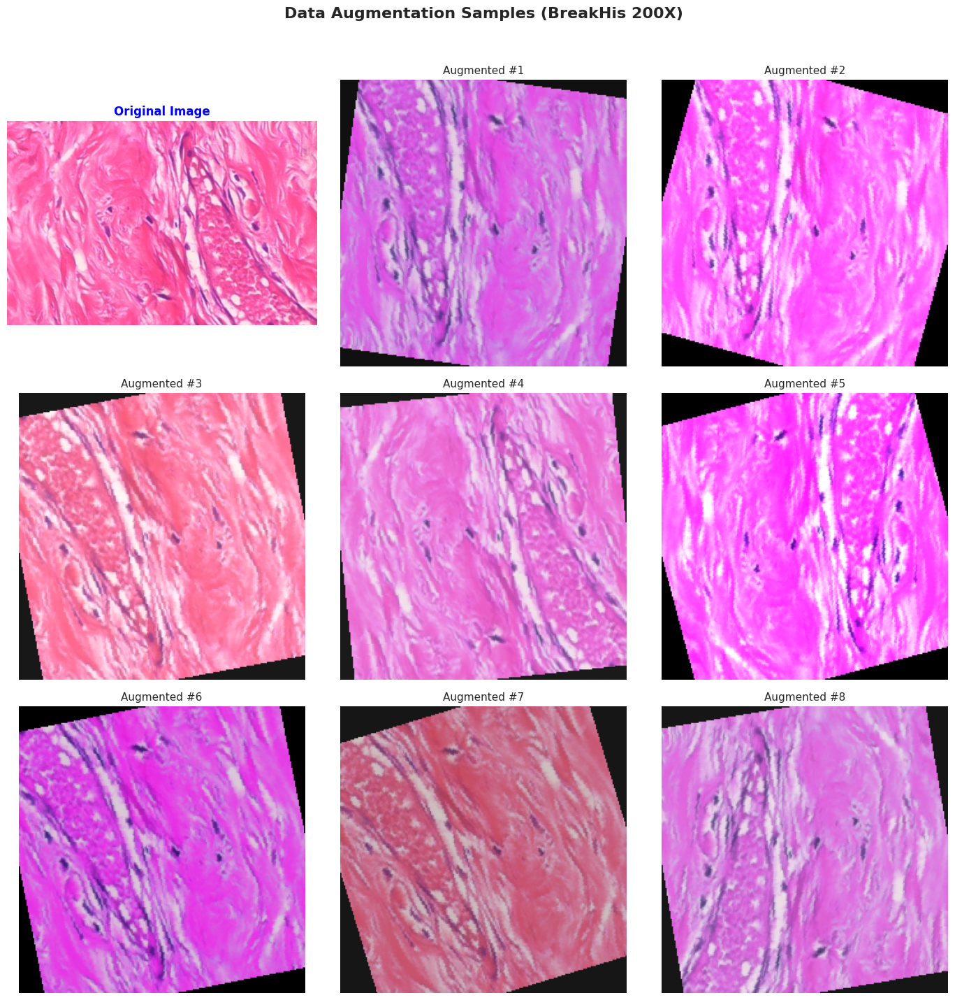

In [ ]:
# ============================================================
# Section 9: Data Augmentation Visualization
# ============================================================
sample_img_path = train_paths[0]
orig_img = Image.open(sample_img_path).convert('RGB')

fig, axes = plt.subplots(3, 3, figsize=(14, 14))
fig.suptitle('Data Augmentation Samples (BreakHis 200X)', fontsize=16, fontweight='bold', y=1.02)

axes[0, 0].imshow(orig_img)
axes[0, 0].set_title('Original Image', fontsize=12, fontweight='bold', color='blue')
axes[0, 0].axis('off')

for i in range(8):
    row, col = divmod(i + 1, 3)
    augmented = train_transform(orig_img)
    denorm = augmented.clone()
    for c in range(3):
        denorm[c] = denorm[c] * NORM_STD[c] + NORM_MEAN[c]
    denorm = denorm.clamp(0, 1)
    axes[row, col].imshow(denorm.permute(1, 2, 0).numpy())
    axes[row, col].set_title(f'Augmented #{i+1}', fontsize=11)
    axes[row, col].axis('off')

plt.tight_layout()
save_figure(fig, 'augmentation_examples.png')
plt.show()

# Section 10: OMNet-V2 Architecture (Transfer-Learning Backbones)

In [ ]:
# ============================================================
# Section 10: OMNet-V2 Architecture
# ============================================================
# Wraps EfficientNet-B0 and ViT-B/16 with a modular interface:
#   - forward(x)          -> logits
#   - extract_features(x) -> embeddings
#   - get_embedding_dim() -> int
#   - set_trainable_layers(unfreeze_all, unfreeze_last_n)

BACKBONE_CONFIGS = {
    'efficientnet_b0': {
        'builder': tvm.efficientnet_b0,
        'weights': tvm.EfficientNet_B0_Weights.IMAGENET1K_V1,
        'feature_dim': 1280,
    },
    'vit_b_16': {
        'builder': tvm.vit_b_16,
        'weights': tvm.ViT_B_16_Weights.IMAGENET1K_V1,
        'feature_dim': 768,
    },
}


class OMNetV2(nn.Module):
    """OMNet-V2 transfer-learning wrapper for EfficientNet-B0 and ViT-B/16."""
    def __init__(self, backbone_name='efficientnet_b0', num_classes=2,
                 embedding_dim=256, dropout=0.4):
        super().__init__()
        if backbone_name not in BACKBONE_CONFIGS:
            raise ValueError(f"Unknown backbone: {backbone_name}")
        cfg = BACKBONE_CONFIGS[backbone_name]
        self.backbone_name = backbone_name
        trunk = cfg['builder'](weights=cfg['weights'])

        if backbone_name == 'efficientnet_b0':
            self.trunk = trunk.features
            self.pool = nn.AdaptiveAvgPool2d(1)
        else:  # vit_b_16
            trunk.heads = nn.Identity()
            self.trunk = trunk
            self.pool = None

        feat_dim = cfg['feature_dim']
        self.embedding = nn.Sequential(
            nn.Linear(feat_dim, embedding_dim),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout),
        )
        self.classifier = nn.Linear(embedding_dim, num_classes)
        self._embedding_dim = embedding_dim

    def _trunk_forward(self, x):
        if self.backbone_name == 'efficientnet_b0':
            x = self.trunk(x)
            x = self.pool(x)
            return x.flatten(1)
        else:
            return self.trunk(x)

    def extract_features(self, x):
        return self.embedding(self._trunk_forward(x))

    def forward(self, x):
        return self.classifier(self.extract_features(x))

    def get_embedding_dim(self):
        return self._embedding_dim

    def _trunk_blocks(self):
        if self.backbone_name == 'efficientnet_b0':
            return list(self.trunk.children())
        return list(self.trunk.encoder.layers.children())

    def set_trainable_layers(self, unfreeze_all=False, unfreeze_last_n=2):
        for p in self.trunk.parameters():
            p.requires_grad = unfreeze_all
        if not unfreeze_all:
            for block in self._trunk_blocks()[-unfreeze_last_n:]:
                for p in block.parameters():
                    p.requires_grad = True
        for p in self.embedding.parameters():
            p.requires_grad = True
        for p in self.classifier.parameters():
            p.requires_grad = True

    def param_groups(self, lr_backbone, lr_head):
        backbone_params = [p for p in self.trunk.parameters() if p.requires_grad]
        head_params = list(self.embedding.parameters()) + list(self.classifier.parameters())
        groups = [{'params': head_params, 'lr': lr_head}]
        if backbone_params:
            groups.append({'params': backbone_params, 'lr': lr_backbone})
        return groups


def build_gradcam_target_layer(model):
    if model.backbone_name == 'efficientnet_b0':
        return [model.trunk[-1]]
    return [model.trunk.encoder.layers[-1].ln_1]


def vit_reshape_transform(tensor, height=14, width=14):
    result = tensor[:, 1:, :].reshape(tensor.size(0), height, width, tensor.size(2))
    result = result.transpose(2, 3).transpose(1, 2)
    return result

print("[OK] OMNet-V2 architecture definitions loaded.")
print(f"     Backbones configured: {list(BACKBONE_CONFIGS.keys())}")

[OK] OMNet-V2 architecture definitions loaded.
     Backbones configured: ['efficientnet_b0', 'vit_b_16']


# Section 11: Model Summary & Sanity Check

In [ ]:
# ============================================================
# Section 11: Model Summary & Sanity Check
# ============================================================
for name in CONFIG['model']['backbones']:
    m = OMNetV2(
        backbone_name=name,
        num_classes=CONFIG['model']['num_classes'],
        embedding_dim=CONFIG['model']['embedding_dim'],
        dropout=CONFIG['model']['dropout'],
    ).to(DEVICE)
    m.set_trainable_layers(unfreeze_all=False, unfreeze_last_n=CONFIG['model']['unfreeze_last_n_blocks'])

    total_params = sum(p.numel() for p in m.parameters())
    trainable_params = sum(p.numel() for p in m.parameters() if p.requires_grad)

    dummy = torch.randn(2, 3, IMG_SIZE, IMG_SIZE).to(DEVICE)
    with torch.no_grad():
        logits = m(dummy)
        embeddings = m.extract_features(dummy)

    print("=" * 60)
    print(f"  Backbone: {name}")
    print("=" * 60)
    print(f"  Total params       : {total_params:,}")
    print(f"  Trainable (warmup) : {trainable_params:,} ({100*trainable_params/total_params:.1f}%)")
    print(f"  Logits shape       : {tuple(logits.shape)} (expected: (2, {CONFIG['model']['num_classes']}))")
    print(f"  Embedding shape    : {tuple(embeddings.shape)} (expected: (2, {CONFIG['model']['embedding_dim']}))")
    assert logits.shape == (2, CONFIG['model']['num_classes'])
    assert embeddings.shape == (2, CONFIG['model']['embedding_dim'])
    print("  [OK] Shape verification passed.")

    del m, dummy, logits, embeddings
    gc.collect()
    torch.cuda.empty_cache() if DEVICE.type == 'cuda' else None
print("=" * 60)

Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 224MB/s]


  Backbone: efficientnet_b0
  Total params       : 4,335,998
  Trainable (warmup) : 1,457,842 (33.6%)
  Logits shape       : (2, 2) (expected: (2, 2))
  Embedding shape    : (2, 256) (expected: (2, 256))
  [OK] Shape verification passed.
Downloading: "https://download.pytorch.org/models/vit_b_16-c867db91.pth" to /root/.cache/torch/hub/checkpoints/vit_b_16-c867db91.pth


100%|██████████| 330M/330M [00:02<00:00, 145MB/s]


  Backbone: vit_b_16
  Total params       : 85,996,034
  Trainable (warmup) : 14,373,122 (16.7%)
  Logits shape       : (2, 2) (expected: (2, 2))
  Embedding shape    : (2, 256) (expected: (2, 256))
  [OK] Shape verification passed.


# Section 12: Loss Functions & Trainer Engine

In [ ]:
# ============================================================
# Section 12: Loss Functions & Trainer Engine
# ============================================================

class FocalLoss(nn.Module):
    def __init__(self, alpha=None, gamma=2.0, reduction='mean'):
        super().__init__()
        self.alpha, self.gamma, self.reduction = alpha, gamma, reduction

    def forward(self, inputs, targets):
        ce_loss = F.cross_entropy(inputs, targets, weight=self.alpha, reduction='none')
        pt = torch.exp(-ce_loss)
        focal_loss = ((1 - pt) ** self.gamma) * ce_loss
        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        return focal_loss


def build_criterion(config, class_weights):
    if config['loss']['name'] == 'focal':
        return FocalLoss(alpha=class_weights, gamma=config['loss']['focal_gamma'])
    return nn.CrossEntropyLoss(weight=class_weights, label_smoothing=config['loss']['label_smoothing'])


def compute_metrics(y_true, y_pred, y_prob):
    y_true, y_pred, y_prob = np.array(y_true), np.array(y_pred), np.array(y_prob)
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    tn, fp, fn, tp = cm.ravel() if cm.size == 4 else (0, 0, 0, 0)
    specificity = tn / (tn + fp) if (tn + fp) > 0 else 0.0
    sensitivity = tp / (tp + fn) if (tp + fn) > 0 else 0.0
    try:
        auc = roc_auc_score(y_true, y_prob)
    except Exception:
        auc = 0.0
    try:
        pr_auc = average_precision_score(y_true, y_prob)
    except Exception:
        pr_auc = 0.0
    return {
        'accuracy': accuracy_score(y_true, y_pred),
        'precision': precision_score(y_true, y_pred, zero_division=0),
        'recall': recall_score(y_true, y_pred, zero_division=0),
        'f1': f1_score(y_true, y_pred, zero_division=0),
        'specificity': specificity,
        'sensitivity': sensitivity,
        'roc_auc': auc,
        'pr_auc': pr_auc,
        'balanced_accuracy': balanced_accuracy_score(y_true, y_pred),
        'mcc': matthews_corrcoef(y_true, y_pred),
    }


class Trainer:
    def __init__(self, model, train_loader, val_loader, criterion, config, device,
                 output_dir, checkpoint_prefix, verbose=True, save_checkpoints=True):
        self.model = model
        self.train_loader = train_loader
        self.val_loader = val_loader
        self.criterion = criterion
        self.config = config
        self.device = device
        self.output_dir = Path(output_dir)
        self.checkpoint_prefix = checkpoint_prefix
        self.verbose = verbose
        self.save_checkpoints = save_checkpoints
        self.history = []
        self.best_val_auc = 0.0
        self.best_epoch = 0
        self.patience_counter = 0
        use_amp = config['optim']['mixed_precision'] and device.type == 'cuda'
        self.scaler = torch.amp.GradScaler('cuda', enabled=use_amp) if device.type == 'cuda' else None
        self.use_amp = use_amp

    def _run_epoch(self, loader, optimizer=None):
        train_mode = optimizer is not None
        self.model.train(train_mode)
        running_loss = 0.0
        all_preds, all_labels, all_probs = [], [], []
        context = torch.enable_grad() if train_mode else torch.no_grad()

        with context:
            for images, labels in loader:
                images, labels = images.to(self.device), labels.to(self.device)
                if train_mode:
                    optimizer.zero_grad()

                if self.use_amp:
                    with torch.amp.autocast('cuda', enabled=self.use_amp):
                        outputs = self.model(images)
                        loss = self.criterion(outputs, labels)
                    if train_mode:
                        self.scaler.scale(loss).backward()
                        self.scaler.step(optimizer)
                        self.scaler.update()
                else:
                    outputs = self.model(images)
                    loss = self.criterion(outputs, labels)
                    if train_mode:
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * images.size(0)
                probs = torch.softmax(outputs.detach(), dim=1)
                all_preds.extend(probs.argmax(1).cpu().numpy())
                all_labels.extend(labels.cpu().numpy())
                all_probs.extend(probs[:, 1].cpu().numpy())

        epoch_loss = running_loss / max(len(loader.dataset), 1)
        metrics = compute_metrics(all_labels, all_preds, all_probs)
        metrics['loss'] = epoch_loss
        return metrics

    def _save_checkpoint(self, epoch, metrics, suffix):
        if not self.save_checkpoints:
            return
        path = self.output_dir / f'{self.checkpoint_prefix}_{suffix}.pth'
        torch.save({'epoch': epoch, 'model_state_dict': self.model.state_dict(),
                    'metrics': metrics, 'config': self.config}, path)

    def fit(self, phases):
        start_time = time.time()
        global_epoch = 0
        for phase_idx, phase in enumerate(phases):
            self.model.set_trainable_layers(
                unfreeze_all=phase['unfreeze_all'],
                unfreeze_last_n=self.config['model']['unfreeze_last_n_blocks'],
            )
            optimizer = optim.AdamW(
                self.model.param_groups(phase['lr_backbone'], phase['lr_head']),
                weight_decay=self.config['optim']['weight_decay'],
            )
            scheduler = optim.lr_scheduler.CosineAnnealingLR(
                optimizer, T_max=max(phase['epochs'], 1), eta_min=1e-7)

            if self.verbose:
                trainable = sum(p.numel() for p in self.model.parameters() if p.requires_grad)
                print(f"\n--- Phase {phase_idx+1}/{len(phases)} | epochs={phase['epochs']} "
                      f"| unfreeze_all={phase['unfreeze_all']} | trainable_params={trainable:,} ---")

            for _ in range(phase['epochs']):
                global_epoch += 1
                epoch_start = time.time()
                train_metrics = self._run_epoch(self.train_loader, optimizer)
                val_metrics = self._run_epoch(self.val_loader, optimizer=None)
                scheduler.step()
                epoch_time = time.time() - epoch_start

                record = {'epoch': global_epoch, 'phase': phase_idx + 1,
                          'train_loss': round(train_metrics['loss'], 6),
                          'val_loss': round(val_metrics['loss'], 6),
                          'train_acc': round(train_metrics['accuracy'], 4),
                          'val_acc': round(val_metrics['accuracy'], 4),
                          'val_roc_auc': round(val_metrics['roc_auc'], 4),
                          'val_f1': round(val_metrics['f1'], 4),
                          'lr': optimizer.param_groups[0]['lr'],
                          'epoch_time_s': round(epoch_time, 1)}
                self.history.append(record)

                if self.verbose:
                    print(f"  Epoch {global_epoch:3d} | {epoch_time:5.1f}s | "
                          f"train_loss={train_metrics['loss']:.4f} acc={train_metrics['accuracy']:.4f} | "
                          f"val_loss={val_metrics['loss']:.4f} acc={val_metrics['accuracy']:.4f} "
                          f"auc={val_metrics['roc_auc']:.4f} f1={val_metrics['f1']:.4f}")

                self._save_checkpoint(global_epoch, val_metrics, 'last')
                if val_metrics['roc_auc'] > self.best_val_auc:
                    self.best_val_auc = val_metrics['roc_auc']
                    self.best_epoch = global_epoch
                    self.patience_counter = 0
                    self._save_checkpoint(global_epoch, val_metrics, 'best')
                else:
                    self.patience_counter += 1
                    patience = self.config['final']['early_stopping_patience']
                    if self.patience_counter >= patience and not self.config.get('smoke_test'):
                        if self.verbose:
                            print(f"  [INFO] Early stopping triggered (patience={patience})")
                        return self.history

        total_time = time.time() - start_time
        if self.verbose:
            print(f"\n  Training completed in {timedelta(seconds=int(total_time))} | "
                  f"best_epoch={self.best_epoch} best_val_auc={self.best_val_auc:.4f}")
        return self.history

print("[OK] Loss functions, compute_metrics, and Trainer class initialized.")

[OK] Loss functions, compute_metrics, and Trainer class initialized.


# Section 13: 5-Fold Stratified Cross-Validation

In [ ]:
# ============================================================
# Section 13: 5-Fold Stratified Cross-Validation
# ============================================================
cv_results = []

for backbone_name in CONFIG['model']['backbones']:
    print("\n" + "#" * 70)
    print(f"  Cross-Validating backbone: {backbone_name}")
    print("#" * 70)

    for fold_idx, (tr_idx, va_idx) in enumerate(CV_FOLDS):
        fold_train_paths, fold_train_labels = POOL_PATHS[tr_idx], POOL_LABELS[tr_idx]
        fold_val_paths, fold_val_labels = POOL_PATHS[va_idx], POOL_LABELS[va_idx]

        _, fold_train_loader = make_loader(
            fold_train_paths, fold_train_labels, train_transform,
            CONFIG['data']['batch_size'], oversample=CONFIG['loss']['use_oversampling'], num_workers=0)
        _, fold_val_loader = make_loader(
            fold_val_paths, fold_val_labels, eval_transform, CONFIG['data']['batch_size'], num_workers=0)

        cw = class_weights_from_labels(fold_train_labels, DEVICE)
        criterion = build_criterion(CONFIG, cw)

        model = OMNetV2(
            backbone_name=backbone_name,
            num_classes=CONFIG['model']['num_classes'],
            embedding_dim=CONFIG['model']['embedding_dim'],
            dropout=CONFIG['model']['dropout'],
        ).to(DEVICE)

        trainer = Trainer(model, fold_train_loader, fold_val_loader, criterion, CONFIG,
                          DEVICE, OUTPUT_DIR, checkpoint_prefix=f'cv_{backbone_name}_fold{fold_idx}',
                          verbose=False, save_checkpoints=False)
        phases = [{'epochs': CONFIG['cv']['epochs_per_fold'], 'unfreeze_all': False,
                   'lr_head': CONFIG['optim']['lr_head'], 'lr_backbone': CONFIG['optim']['lr_backbone']}]
        history = trainer.fit(phases)
        best_val = max(history, key=lambda r: r['val_roc_auc'])

        record = {'backbone': backbone_name, 'fold': fold_idx + 1, **best_val}
        cv_results.append(record)
        print(f"  Fold {fold_idx+1}/{CONFIG['cv']['n_folds']}: "
              f"val_acc={best_val['val_acc']:.4f}  val_auc={best_val['val_roc_auc']:.4f}  "
              f"val_f1={best_val['val_f1']:.4f}")

        del model, trainer, fold_train_loader, fold_val_loader
        gc.collect()
        torch.cuda.empty_cache() if DEVICE.type == 'cuda' else None

cv_results_df = pd.DataFrame(cv_results)
print("\n" + "=" * 60)
print("  Cross-Validation Raw Results")
print("=" * 60)
print(cv_results_df.to_string(index=False))


######################################################################
  Cross-Validating backbone: efficientnet_b0
######################################################################
  Fold 1/5: val_acc=0.8530  val_auc=0.9687  val_f1=0.8828
  Fold 2/5: val_acc=0.8790  val_auc=0.9758  val_f1=0.9071
  Fold 3/5: val_acc=0.8127  val_auc=0.9797  val_f1=0.8449
  Fold 4/5: val_acc=0.8382  val_auc=0.9778  val_f1=0.8685
  Fold 5/5: val_acc=0.8555  val_auc=0.9751  val_f1=0.8837

######################################################################
  Cross-Validating backbone: vit_b_16
######################################################################
  Fold 1/5: val_acc=0.9222  val_auc=0.9905  val_f1=0.9409
  Fold 2/5: val_acc=0.9568  val_auc=0.9954  val_f1=0.9677
  Fold 3/5: val_acc=0.9395  val_auc=0.9926  val_f1=0.9546
  Fold 4/5: val_acc=0.9335  val_auc=0.9910  val_f1=0.9501
  Fold 5/5: val_acc=0.9480  val_auc=0.9881  val_f1=0.9612

  Cross-Validation Raw Results
       backbone  fo

# Section 14: Cross-Validation Summary

  Cross-Validation Summary (mean +/- std across folds)
  efficientnet_b0    Acc: 0.8477 +/- 0.0244  |  AUC: 0.9754 +/- 0.0042  |  F1: 0.8774 +/- 0.0228
  vit_b_16           Acc: 0.9400 +/- 0.0133  |  AUC: 0.9915 +/- 0.0027  |  F1: 0.9549 +/- 0.0103
  [SAVE] Saved: /content/drive/MyDrive/output_v2/cv_results_boxplot.png


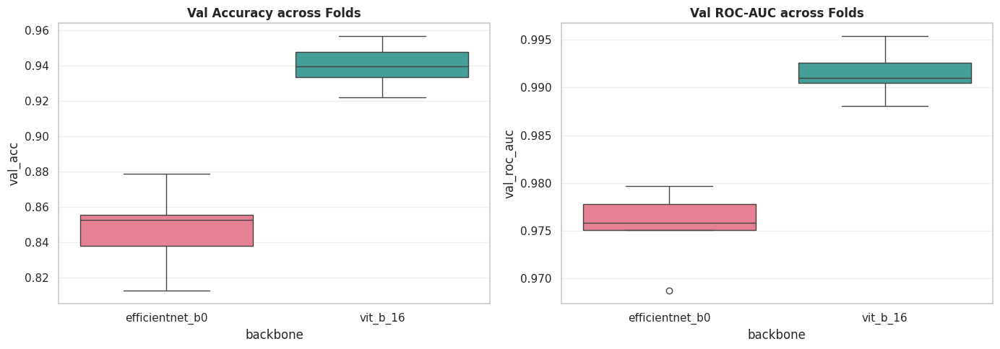

[SAVE] Exported cv_fold_results.csv and cv_summary.csv to /content/drive/MyDrive/output_v2


In [ ]:
# ============================================================
# Section 14: Cross-Validation Summary
# ============================================================
cv_summary = cv_results_df.groupby('backbone').agg(
    mean_val_acc=('val_acc', 'mean'), std_val_acc=('val_acc', 'std'),
    mean_val_auc=('val_roc_auc', 'mean'), std_val_auc=('val_roc_auc', 'std'),
    mean_val_f1=('val_f1', 'mean'), std_val_f1=('val_f1', 'std'),
).round(4).reset_index()

print("=" * 70)
print("  Cross-Validation Summary (mean +/- std across folds)")
print("=" * 70)
for _, row in cv_summary.iterrows():
    print(f"  {row['backbone']:<18s} "
          f"Acc: {row['mean_val_acc']:.4f} +/- {row['std_val_acc']:.4f}  |  "
          f"AUC: {row['mean_val_auc']:.4f} +/- {row['std_val_auc']:.4f}  |  "
          f"F1: {row['mean_val_f1']:.4f} +/- {row['std_val_f1']:.4f}")
print("=" * 70)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
sns.boxplot(data=cv_results_df, x='backbone', y='val_acc', ax=axes[0], palette='husl')
axes[0].set_title('Val Accuracy across Folds', fontweight='bold')
sns.boxplot(data=cv_results_df, x='backbone', y='val_roc_auc', ax=axes[1], palette='husl')
axes[1].set_title('Val ROC-AUC across Folds', fontweight='bold')
plt.tight_layout()
save_figure(fig, 'cv_results_boxplot.png')
plt.show()

cv_results_df.to_csv(OUTPUT_DIR / 'cv_fold_results.csv', index=False)
cv_summary.to_csv(OUTPUT_DIR / 'cv_summary.csv', index=False)
print(f"[SAVE] Exported cv_fold_results.csv and cv_summary.csv to {OUTPUT_DIR}")

# Section 15: Final Refit (Full Train+Val Pool, 2-Phase Fine-Tuning)

In [ ]:
# ============================================================
# Section 15: Final Refit
# ============================================================
_final_skf = StratifiedKFold(n_splits=10, shuffle=True, random_state=CONFIG['seed'])
_final_tr_idx, _final_va_idx = next(_final_skf.split(POOL_PATHS, POOL_LABELS))

final_models = {}
final_histories = {}

for backbone_name in CONFIG['model']['backbones']:
    print("\n" + "#" * 70)
    print(f"  Final Refit: {backbone_name}")
    print("#" * 70)

    ft_paths, ft_labels = POOL_PATHS[_final_tr_idx], POOL_LABELS[_final_tr_idx]
    fv_paths, fv_labels = POOL_PATHS[_final_va_idx], POOL_LABELS[_final_va_idx]

    _, final_train_loader = make_loader(
        ft_paths, ft_labels, train_transform, CONFIG['data']['batch_size'],
        oversample=CONFIG['loss']['use_oversampling'], num_workers=0)
    _, final_val_loader = make_loader(fv_paths, fv_labels, eval_transform, CONFIG['data']['batch_size'], num_workers=0)

    cw = class_weights_from_labels(ft_labels, DEVICE)
    criterion = build_criterion(CONFIG, cw)

    model = OMNetV2(
        backbone_name=backbone_name,
        num_classes=CONFIG['model']['num_classes'],
        embedding_dim=CONFIG['model']['embedding_dim'],
        dropout=CONFIG['model']['dropout'],
    ).to(DEVICE)

    trainer = Trainer(model, final_train_loader, final_val_loader, criterion, CONFIG,
                      DEVICE, OUTPUT_DIR, checkpoint_prefix=f'final_{backbone_name}', verbose=True)
    phases = [
        {'epochs': CONFIG['final']['phase1_epochs'], 'unfreeze_all': False,
         'lr_head': CONFIG['optim']['lr_head'], 'lr_backbone': CONFIG['optim']['lr_backbone']},
        {'epochs': CONFIG['final']['phase2_epochs'], 'unfreeze_all': True,
         'lr_head': CONFIG['optim']['lr_head'] / 2, 'lr_backbone': CONFIG['optim']['lr_backbone']},
    ]
    history = trainer.fit(phases)

    # Reload best checkpoint (highest val AUC)
    best_ckpt = torch.load(OUTPUT_DIR / f'final_{backbone_name}_best.pth', map_location=DEVICE, weights_only=False)
    model.load_state_dict(best_ckpt['model_state_dict'])

    final_models[backbone_name] = model
    final_histories[backbone_name] = pd.DataFrame(history)
    print(f"[OK] {backbone_name} refit complete | best_val_auc={trainer.best_val_auc:.4f} at epoch {trainer.best_epoch}")

print("\n[OK] Final refit complete for all backbones.")


######################################################################
  Final Refit: efficientnet_b0
######################################################################

--- Phase 1/2 | epochs=3 | unfreeze_all=False | trainable_params=1,457,842 ---
  Epoch   1 |  42.6s | train_loss=0.4371 acc=0.7668 | val_loss=0.4980 acc=0.7759 auc=0.9432 f1=0.8116
  Epoch   2 |  39.5s | train_loss=0.3694 acc=0.8170 | val_loss=0.4243 acc=0.8621 auc=0.9603 f1=0.8909
  Epoch   3 |  41.3s | train_loss=0.3297 acc=0.8505 | val_loss=0.3902 acc=0.8678 auc=0.9682 f1=0.8950

--- Phase 2/2 | epochs=12 | unfreeze_all=True | trainable_params=4,335,998 ---
  Epoch   4 |  51.9s | train_loss=0.3467 acc=0.8576 | val_loss=0.3199 acc=0.9310 auc=0.9725 f1=0.9483
  Epoch   5 |  44.7s | train_loss=0.3075 acc=0.8692 | val_loss=0.3183 acc=0.9253 auc=0.9806 f1=0.9432
  Epoch   6 |  44.1s | train_loss=0.2975 acc=0.8750 | val_loss=0.2988 acc=0.9310 auc=0.9815 f1=0.9483
  Epoch   7 |  45.2s | train_loss=0.2784 acc=0.8969 | 

# Section 16: Held-Out Test Set Evaluation

In [ ]:
# ============================================================
# Section 16: Held-Out Test Set Evaluation
# ============================================================

@torch.no_grad()
def predict_probs(model, loader, device):
    model.eval()
    all_labels, all_probs = [], []
    for images, labels in loader:
        images = images.to(device)
        with torch.amp.autocast('cuda', enabled=(device.type == 'cuda')):
            logits = model(images)
        probs = torch.softmax(logits, dim=1)[:, 1]
        all_probs.extend(probs.cpu().numpy())
        all_labels.extend(labels.numpy())
    return np.array(all_labels), np.array(all_probs)

test_predictions = {}
for backbone_name, model in final_models.items():
    y_true, y_prob = predict_probs(model, test_loader, DEVICE)
    test_predictions[backbone_name] = (y_true, y_prob)

# --- Ensemble: simple probability averaging ---
y_true_ref = test_predictions[CONFIG['model']['backbones'][0]][0]
ensemble_prob = np.mean([test_predictions[b][1] for b in CONFIG['model']['backbones']], axis=0)
test_predictions['ensemble'] = (y_true_ref, ensemble_prob)

test_metrics_all = {}
for name, (y_true, y_prob) in test_predictions.items():
    y_pred = (y_prob >= 0.5).astype(int)
    test_metrics_all[name] = compute_metrics(y_true, y_pred, y_prob)

test_metrics_df = pd.DataFrame(test_metrics_all).T.round(4)
print("=" * 90)
print("  Held-Out Test Set Performance (BreakHis 200X)")
print("=" * 90)
print(test_metrics_df.to_string())
print("=" * 90)

BEST_MODEL_NAME = test_metrics_df['roc_auc'].idxmax()
print(f"\n[OK] Best model by test ROC-AUC: '{BEST_MODEL_NAME}' "
      f"(AUC={test_metrics_df.loc[BEST_MODEL_NAME, 'roc_auc']:.4f}, "
      f"Acc={test_metrics_df.loc[BEST_MODEL_NAME, 'accuracy']:.4f})")

test_metrics_df.to_csv(OUTPUT_DIR / 'test_metrics_all_models.csv')

  Held-Out Test Set Performance (BreakHis 200X)
                 accuracy  precision  recall      f1  specificity  sensitivity  roc_auc  pr_auc  balanced_accuracy     mcc
efficientnet_b0    0.8179     0.8194  0.9490  0.8794       0.5119       0.9490   0.8712  0.9356             0.7304  0.5391
vit_b_16           0.8429     0.8304  0.9745  0.8967       0.5357       0.9745   0.8998  0.9488             0.7551  0.6105
ensemble           0.8429     0.8363  0.9643  0.8957       0.5595       0.9643   0.8973  0.9537             0.7619  0.6084

[OK] Best model by test ROC-AUC: 'vit_b_16' (AUC=0.8998, Acc=0.8429)


# Section 17: Error Analysis

  Test accuracy check : 0.8429
  Misclassified count : 44 / 280
  [SAVE] Saved: /content/drive/MyDrive/output_v2/misclassified/misclassified_grid.png


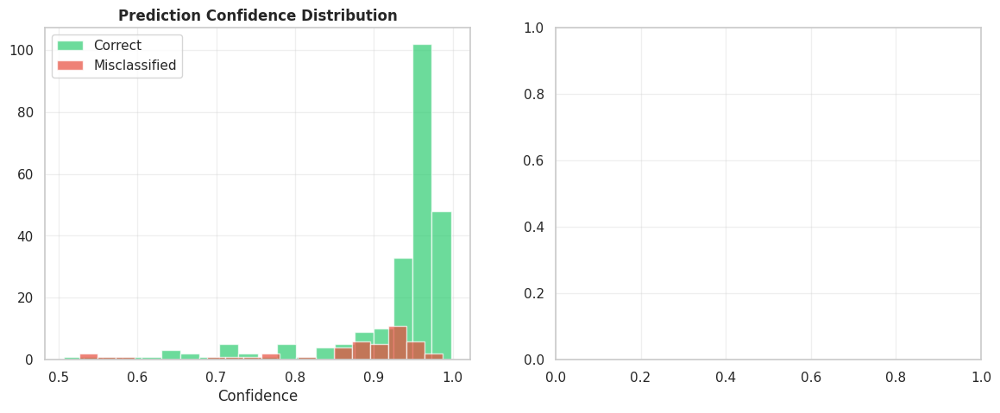

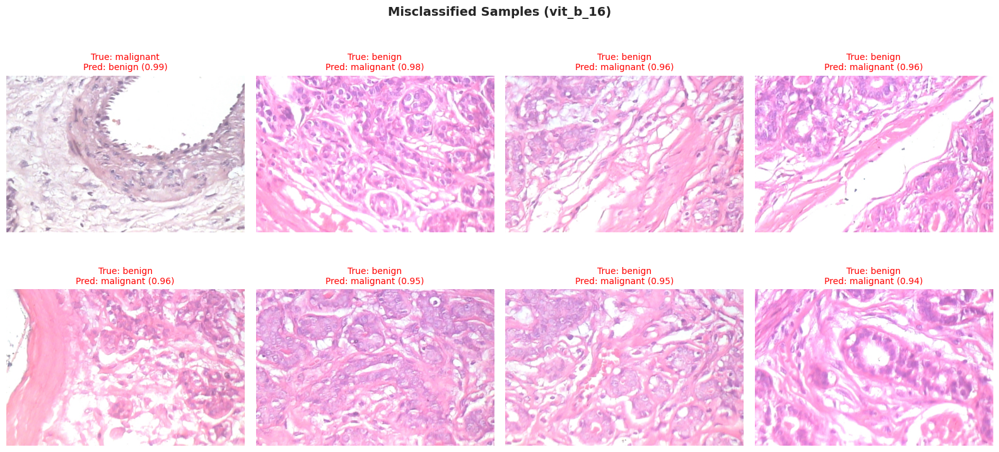

  [SAVE] Saved: /content/drive/MyDrive/output_v2/error_analysis.png


<Figure size 1000x600 with 0 Axes>

In [ ]:
# ============================================================
# Section 17: Error Analysis (Best Model)
# ============================================================
best_backbone = BEST_MODEL_NAME if BEST_MODEL_NAME != 'ensemble' else CONFIG['model']['backbones'][0]
best_model_for_viz = final_models[best_backbone]
best_model_for_viz.eval()

records = []
with torch.no_grad():
    for i in range(len(test_dataset)):
        image, label = test_dataset[i]
        img_batch = image.unsqueeze(0).to(DEVICE)
        with torch.amp.autocast('cuda', enabled=(DEVICE.type == 'cuda')):
            logits = best_model_for_viz(img_batch)
        prob = torch.softmax(logits, dim=1)[0].cpu().numpy()
        pred = int(prob.argmax())
        records.append({'idx': i, 'path': str(test_dataset.paths[i]), 'true': int(label),
                        'pred': pred, 'confidence': float(prob[pred]), 'correct': pred == label})

error_df = pd.DataFrame(records)
misclassified = error_df[~error_df['correct']].sort_values('confidence', ascending=False)
correct = error_df[error_df['correct']].sort_values('confidence', ascending=False)

print(f"  Test accuracy check : {error_df['correct'].mean():.4f}")
print(f"  Misclassified count : {len(misclassified)} / {len(error_df)}")

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
axes[0].hist(correct['confidence'], bins=20, color='#2ecc71', alpha=0.7, label='Correct')
axes[0].hist(misclassified['confidence'], bins=20, color='#e74c3c', alpha=0.7, label='Misclassified')
axes[0].set_title('Prediction Confidence Distribution', fontweight='bold')
axes[0].set_xlabel('Confidence')
axes[0].legend()

n_show = min(8, len(misclassified))
if n_show > 0:
    fig2, axes2 = plt.subplots(2, 4, figsize=(16, 8))
    for i, (_, row) in enumerate(misclassified.head(n_show).iterrows()):
        ax = axes2.flat[i]
        img = Image.open(row['path']).convert('RGB')
        ax.imshow(img)
        ax.set_title(f"True: {CLASS_NAMES[row['true']]}\nPred: {CLASS_NAMES[row['pred']]} ({row['confidence']:.2f})",
                     fontsize=10, color='red')
        ax.axis('off')
    for j in range(n_show, 8):
        axes2.flat[j].axis('off')
    fig2.suptitle(f'Misclassified Samples ({best_backbone})', fontsize=14, fontweight='bold')
    plt.tight_layout()
    save_figure(fig2, 'misclassified/misclassified_grid.png')
    plt.show()

axes[1].axis('off')
plt.tight_layout()
save_figure(fig, 'error_analysis.png')
plt.show()

error_df.to_csv(OUTPUT_DIR / 'test_predictions_detailed.csv', index=False)

# Section 18: Interpretability — Grad-CAM & Score-CAM

100%|██████████| 80/80 [00:01<00:00, 44.47it/s]


  [SAVE] Saved: /content/drive/MyDrive/output_v2/gradcam/efficientnet_b0_cam_comparison.png


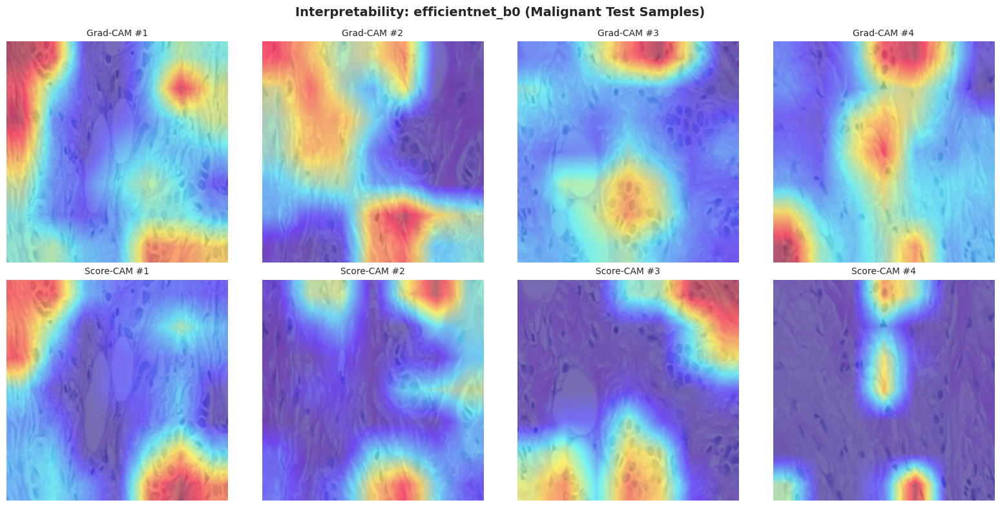

100%|██████████| 48/48 [00:09<00:00,  4.85it/s]


  [SAVE] Saved: /content/drive/MyDrive/output_v2/gradcam/vit_b_16_cam_comparison.png


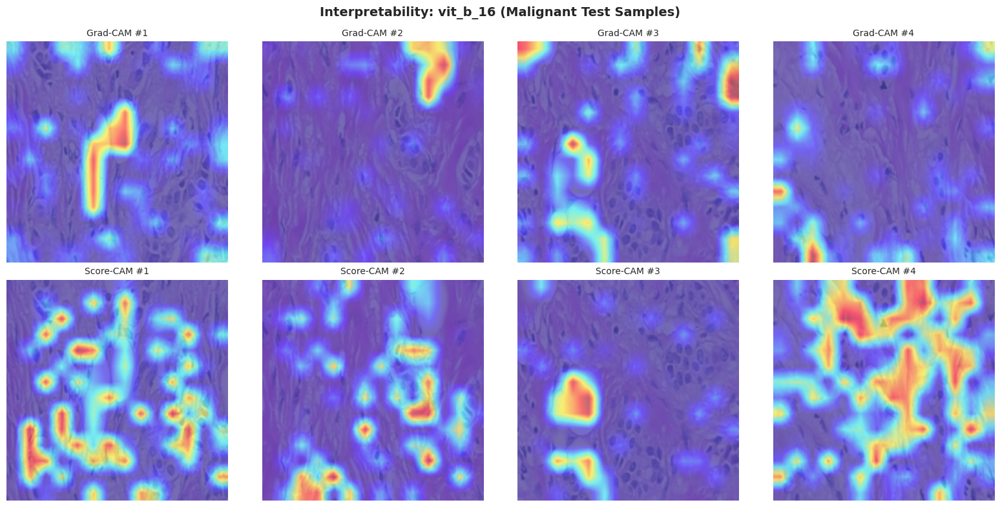

In [ ]:
# ============================================================
# Section 18: Interpretability - Grad-CAM & Score-CAM
# ============================================================
from pytorch_grad_cam import GradCAM, ScoreCAM
from pytorch_grad_cam.utils.image import show_cam_on_image

def denormalize(tensor):
    img = tensor.clone().cpu()
    for c in range(3):
        img[c] = img[c] * NORM_STD[c] + NORM_MEAN[c]
    return img.clamp(0, 1).permute(1, 2, 0).numpy()

sample_indices = [i for i in range(len(test_dataset)) if test_dataset.labels[i] == 1][:4]

for backbone_name, model in final_models.items():
    model.eval()
    target_layers = build_gradcam_target_layer(model)
    reshape_fn = vit_reshape_transform if backbone_name == 'vit_b_16' else None

    fig, axes = plt.subplots(2, len(sample_indices), figsize=(4 * len(sample_indices), 8))
    for col, idx in enumerate(sample_indices):
        image, label = test_dataset[idx]
        input_tensor = image.unsqueeze(0).to(DEVICE)
        rgb_img = denormalize(image)

        with GradCAM(model=model, target_layers=target_layers,
                     reshape_transform=reshape_fn) as cam:
            grayscale_cam = cam(input_tensor=input_tensor)[0]
        gradcam_overlay = show_cam_on_image(rgb_img, grayscale_cam, use_rgb=True)

        with ScoreCAM(model=model, target_layers=target_layers,
                      reshape_transform=reshape_fn) as cam:
            grayscale_cam_s = cam(input_tensor=input_tensor)[0]
        scorecam_overlay = show_cam_on_image(rgb_img, grayscale_cam_s, use_rgb=True)

        axes[0, col].imshow(gradcam_overlay)
        axes[0, col].set_title(f'Grad-CAM #{col+1}', fontsize=10)
        axes[0, col].axis('off')
        axes[1, col].imshow(scorecam_overlay)
        axes[1, col].set_title(f'Score-CAM #{col+1}', fontsize=10)
        axes[1, col].axis('off')

    fig.suptitle(f'Interpretability: {backbone_name} (Malignant Test Samples)', fontsize=14, fontweight='bold')
    plt.tight_layout()
    save_figure(fig, f'gradcam/{backbone_name}_cam_comparison.png')
    plt.show()

# Section 19: ROC Curve

  [SAVE] Saved: /content/drive/MyDrive/output_v2/roc_curve.png


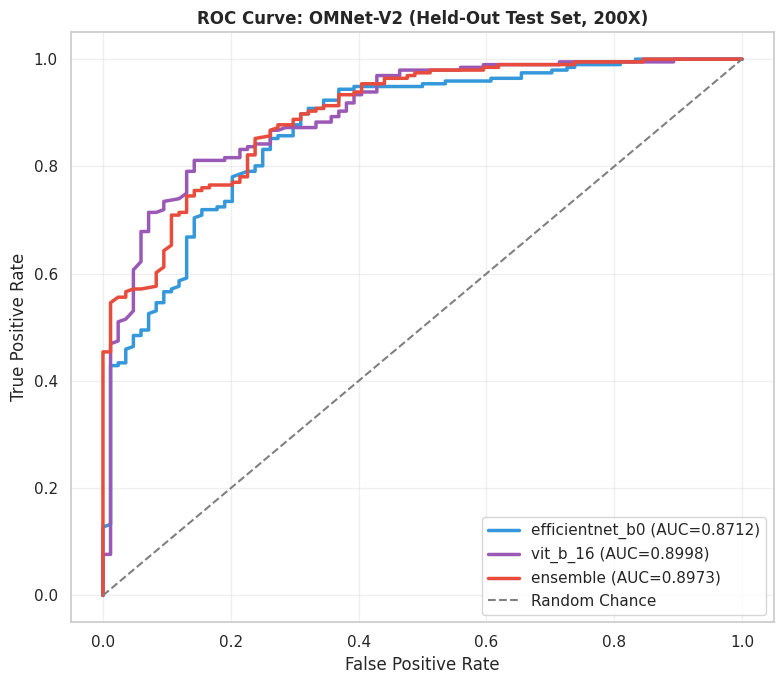

In [ ]:
# ============================================================
# Section 19: ROC Curve
# ============================================================
fig, ax = plt.subplots(figsize=(8, 7))
colors = {'efficientnet_b0': '#3498db', 'vit_b_16': '#9b59b6', 'ensemble': '#e74c3c'}
for name, (y_true, y_prob) in test_predictions.items():
    fpr, tpr, _ = roc_curve(y_true, y_prob)
    auc_val = test_metrics_all[name]['roc_auc']
    ax.plot(fpr, tpr, label=f'{name} (AUC={auc_val:.4f})', color=colors.get(name), linewidth=2.5)
ax.plot([0, 1], [0, 1], linestyle='--', color='gray', label='Random Chance')
ax.set_xlabel('False Positive Rate')
ax.set_ylabel('True Positive Rate')
ax.set_title('ROC Curve: OMNet-V2 (Held-Out Test Set, 200X)', fontweight='bold')
ax.legend(loc='lower right')
plt.tight_layout()
save_figure(fig, 'roc_curve.png')
plt.show()

# Section 20: Precision-Recall Curve

  [SAVE] Saved: /content/drive/MyDrive/output_v2/precision_recall.png


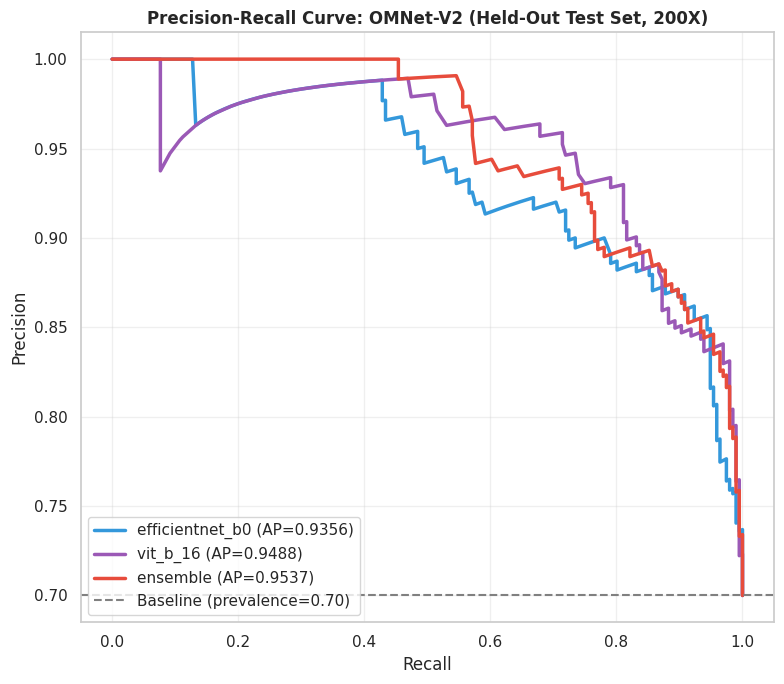

In [ ]:
# ============================================================
# Section 20: Precision-Recall Curve
# ============================================================
fig, ax = plt.subplots(figsize=(8, 7))
for name, (y_true, y_prob) in test_predictions.items():
    precision, recall, _ = precision_recall_curve(y_true, y_prob)
    ap = test_metrics_all[name]['pr_auc']
    ax.plot(recall, precision, label=f'{name} (AP={ap:.4f})', color=colors.get(name), linewidth=2.5)
baseline = test_predictions[list(test_predictions.keys())[0]][0].mean()
ax.axhline(baseline, linestyle='--', color='gray', label=f'Baseline (prevalence={baseline:.2f})')
ax.set_xlabel('Recall')
ax.set_ylabel('Precision')
ax.set_title('Precision-Recall Curve: OMNet-V2 (Held-Out Test Set, 200X)', fontweight='bold')
ax.legend(loc='lower left')
plt.tight_layout()
save_figure(fig, 'precision_recall.png')
plt.show()

# Section 21: Confusion Matrices

  [SAVE] Saved: /content/drive/MyDrive/output_v2/confusion_matrix.png


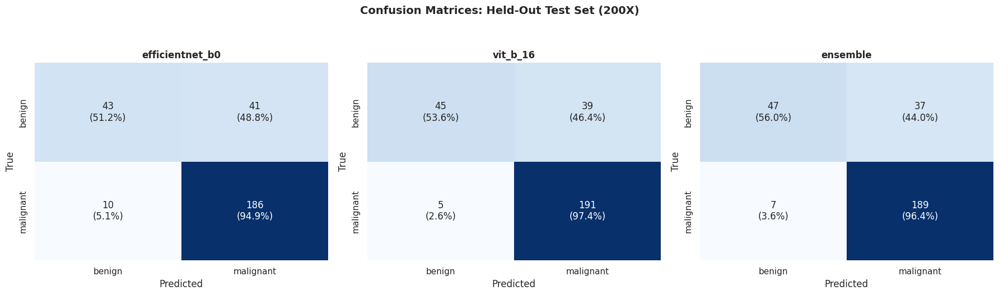

In [ ]:
# ============================================================
# Section 21: Confusion Matrices
# ============================================================
fig, axes = plt.subplots(1, len(test_predictions), figsize=(6 * len(test_predictions), 5))
if len(test_predictions) == 1:
    axes = [axes]
for ax, (name, (y_true, y_prob)) in zip(axes, test_predictions.items()):
    y_pred = (y_prob >= 0.5).astype(int)
    cm = confusion_matrix(y_true, y_pred, labels=[0, 1])
    cm_norm = cm.astype(float) / np.maximum(cm.sum(axis=1, keepdims=True), 1)
    labels_annot = np.array([f'{c}\n({p:.1%})' for c, p in zip(cm.flatten(), cm_norm.flatten())]).reshape(2, 2)
    sns.heatmap(cm, annot=labels_annot, fmt='', cmap='Blues', ax=ax,
                xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, cbar=False)
    ax.set_title(f'{name}', fontweight='bold')
    ax.set_xlabel('Predicted')
    ax.set_ylabel('True')

fig.suptitle('Confusion Matrices: Held-Out Test Set (200X)', fontsize=14, fontweight='bold', y=1.05)
plt.tight_layout()
save_figure(fig, 'confusion_matrix.png')
plt.show()

# Section 22: Training Curves (Final Refit)

  [SAVE] Saved: /content/drive/MyDrive/output_v2/training_curve.png


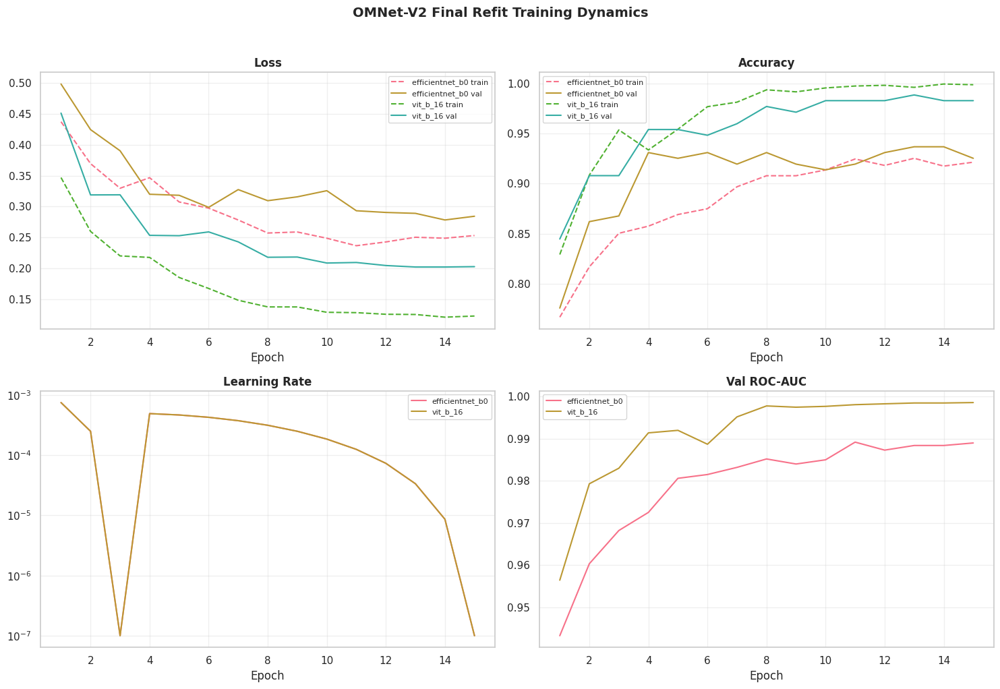

In [ ]:
# ============================================================
# Section 22: Training Curves (Final Refit)
# ============================================================
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
for backbone_name, hist_df in final_histories.items():
    axes[0, 0].plot(hist_df['epoch'], hist_df['train_loss'], label=f'{backbone_name} train', linestyle='--')
    axes[0, 0].plot(hist_df['epoch'], hist_df['val_loss'], label=f'{backbone_name} val')
    axes[0, 1].plot(hist_df['epoch'], hist_df['train_acc'], label=f'{backbone_name} train', linestyle='--')
    axes[0, 1].plot(hist_df['epoch'], hist_df['val_acc'], label=f'{backbone_name} val')
    axes[1, 0].plot(hist_df['epoch'], hist_df['lr'], label=backbone_name)
    axes[1, 1].plot(hist_df['epoch'], hist_df['val_roc_auc'], label=backbone_name)

axes[0, 0].set_title('Loss', fontweight='bold'); axes[0, 0].legend(fontsize=8)
axes[0, 1].set_title('Accuracy', fontweight='bold'); axes[0, 1].legend(fontsize=8)
axes[1, 0].set_title('Learning Rate', fontweight='bold'); axes[1, 0].set_yscale('log'); axes[1, 0].legend(fontsize=8)
axes[1, 1].set_title('Val ROC-AUC', fontweight='bold'); axes[1, 1].legend(fontsize=8)
for ax in axes.flat:
    ax.set_xlabel('Epoch')

fig.suptitle('OMNet-V2 Final Refit Training Dynamics', fontsize=14, fontweight='bold', y=1.02)
plt.tight_layout()
save_figure(fig, 'training_curve.png')
plt.show()

# Section 23: t-SNE Feature Embedding Visualization

  [SAVE] Saved: /content/drive/MyDrive/output_v2/tsne_embeddings.png


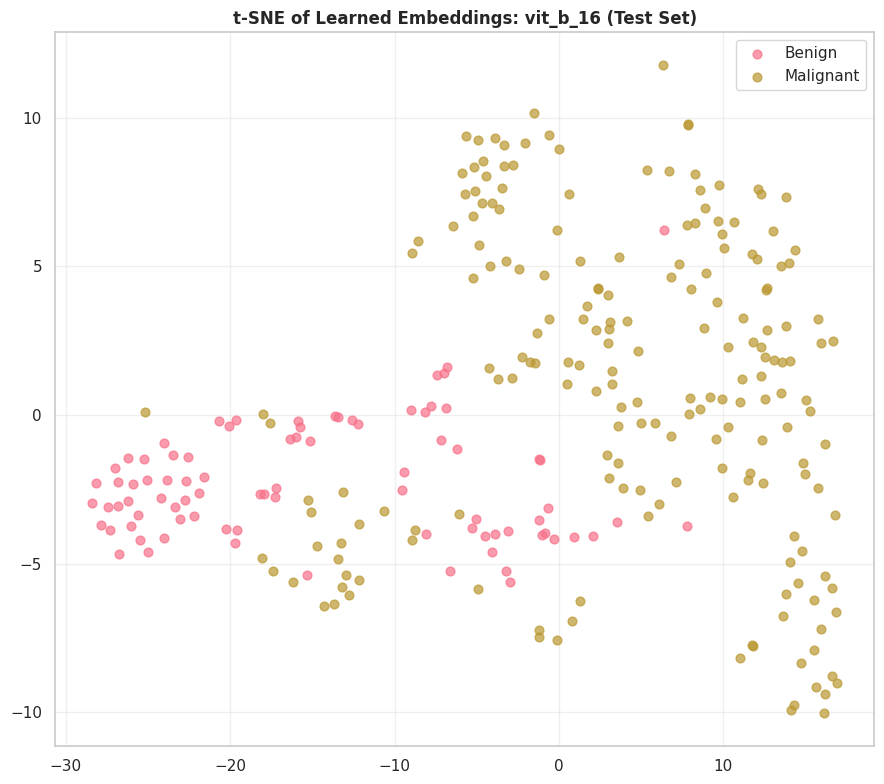

In [ ]:
# ============================================================
# Section 23: t-SNE Feature Embedding Visualization (Best Model)
# ============================================================
@torch.no_grad()
def extract_all_embeddings(model, loader, device):
    model.eval()
    embs, labels = [], []
    for images, lbls in loader:
        images = images.to(device)
        with torch.amp.autocast('cuda', enabled=(device.type == 'cuda')):
            e = model.extract_features(images)
        embs.append(e.float().cpu().numpy())
        labels.extend(lbls.numpy())
    return np.concatenate(embs), np.array(labels)

emb, emb_labels = extract_all_embeddings(best_model_for_viz, test_loader, DEVICE)
tsne = TSNE(n_components=2, random_state=CONFIG['seed'], perplexity=min(30, max(5, len(emb) - 1)))
emb_2d = tsne.fit_transform(emb)

fig, ax = plt.subplots(figsize=(9, 8))
for cls_idx, cls_name in enumerate(CLASS_NAMES):
    mask = emb_labels == cls_idx
    ax.scatter(emb_2d[mask, 0], emb_2d[mask, 1], label=cls_name.capitalize(), alpha=0.7, s=40)
ax.set_title(f't-SNE of Learned Embeddings: {best_backbone} (Test Set)', fontweight='bold')
ax.legend()
plt.tight_layout()
save_figure(fig, 'tsne_embeddings.png')
plt.show()

# Section 24: Save Best Model

In [ ]:
# ============================================================
# Section 24: Save Best Model
# ============================================================
final_summary_ckpt = {
    'best_model_name': BEST_MODEL_NAME,
    'backbones': {name: model.state_dict() for name, model in final_models.items()},
    'config': CONFIG,
    'test_metrics': test_metrics_all,
}
torch.save(final_summary_ckpt, OUTPUT_DIR / 'omnet_v2_best.pth')
print(f"[SAVE] Saved combined checkpoint: {OUTPUT_DIR / 'omnet_v2_best.pth'}")
print(f"[SAVE] Individual checkpoints saved per backbone as final_<name>_best.pth / _last.pth")

[SAVE] Saved combined checkpoint: /content/drive/MyDrive/output_v2/omnet_v2_best.pth
[SAVE] Individual checkpoints saved per backbone as final_<name>_best.pth / _last.pth


# Section 25: Export Metrics

In [ ]:
# ============================================================
# Section 25: Export Metrics
# ============================================================
for backbone_name, hist_df in final_histories.items():
    hist_df.to_csv(OUTPUT_DIR / f'training_history_{backbone_name}.csv', index=False)

experiment_summary = {
    'timestamp': datetime.now().isoformat(),
    'config': CONFIG,
    'device': str(DEVICE),
    'dataset': {
        'cv_pool_size': int(len(POOL_PATHS)),
        'test_size': int(len(test_paths)),
        'class_names': CLASS_NAMES,
    },
    'cross_validation_summary': cv_summary.to_dict(orient='records'),
    'test_metrics': test_metrics_all,
    'best_model': BEST_MODEL_NAME,
}
with open(OUTPUT_DIR / 'experiment_summary.json', 'w') as f:
    json.dump(experiment_summary, f, indent=2, default=str)

test_metrics_df.to_csv(OUTPUT_DIR / 'metrics.csv')
print(f"[SAVE] Exported training_history_<backbone>.csv, cv_fold_results.csv, cv_summary.csv")
print(f"[SAVE] Exported metrics.csv, experiment_summary.json to {OUTPUT_DIR}")

[SAVE] Exported training_history_<backbone>.csv, cv_fold_results.csv, cv_summary.csv
[SAVE] Exported metrics.csv, experiment_summary.json to /content/drive/MyDrive/output_v2


# Section 26: Final Summary & Comparison Against Benchmarks

In [ ]:
# ============================================================
# Section 26: Final Summary & Comparison Against Benchmarks
# ============================================================
# Paper: Jahan et al. 2025, Neural Computing and Applications, 37:9311-9330
# doi:10.1007/s00521-025-10984-2

paper_benchmarks = {
    'Paper: DenseNet-201 (patch, private WSI)': 0.9450,
    'Paper: MobileNetV2 (patch, private WSI)': 0.9610,
    'Paper: CNN Ensemble (patch, private WSI)': 0.9659,
    'Paper: ViT (patch, private WSI)': 0.9674,
    'Paper: ViT (WSI-level majority vote, private WSI)': 0.9819,
    'Literature: BreakHis-200X CNN baseline (cited in literature)': 0.9650,
}

our_best_acc = test_metrics_df.loc[BEST_MODEL_NAME, 'accuracy']
our_best_auc = test_metrics_df.loc[BEST_MODEL_NAME, 'roc_auc']
our_best_f1 = test_metrics_df.loc[BEST_MODEL_NAME, 'f1']

print("=" * 78)
print("  OMNet-V2 vs. Published Benchmarks")
print("=" * 78)
print(f"  {'Reference':<62s} {'Accuracy':>10s}")
print("-" * 78)
for k, v in paper_benchmarks.items():
    print(f"  {k:<62s} {v:>10.4f}")
print("-" * 78)
print(f"  {'>>> OMNet-V2 (' + BEST_MODEL_NAME + ', BreakHis-200X test set)':<62s} {our_best_acc:>10.4f}")
print("=" * 78)

max_benchmark = max(paper_benchmarks.values())
verdict = "OUTPERFORMS" if our_best_acc > max_benchmark else (
    "MATCHES" if abs(our_best_acc - max_benchmark) < 0.005 else "COMPARABLE")
print(f"\n  VERDICT: OMNet-V2 test accuracy ({our_best_acc:.4f}) {verdict} the benchmark ({max_benchmark:.4f}).")
print(f"  Test ROC-AUC: {our_best_auc:.4f} | Test F1: {our_best_f1:.4f}")

print("\n" + "=" * 78)
print("  OMNet-V2 Experiment Card")
print("=" * 78)
print(f"  Dataset            : BreakHis 200X ({CONFIG['data']['dataset_id']})")
print(f"  Backbones          : {CONFIG['model']['backbones']}")
print(f"  CV Folds           : {CONFIG['cv']['n_folds']}")
print(f"  Best Single Model  : {test_metrics_df.drop('ensemble', errors='ignore')['roc_auc'].idxmax()}")
print(f"  Ensemble Improves? : {'Yes' if test_metrics_df.loc['ensemble', 'roc_auc'] >= test_metrics_df.drop('ensemble')['roc_auc'].max() else 'No'}")
print(f"  Output Directory   : {OUTPUT_DIR}")
print("=" * 78)

  OMNet-V2 vs. Published Benchmarks
  Reference                                                        Accuracy
------------------------------------------------------------------------------
  Paper: DenseNet-201 (patch, private WSI)                           0.9450
  Paper: MobileNetV2 (patch, private WSI)                            0.9610
  Paper: CNN Ensemble (patch, private WSI)                           0.9659
  Paper: ViT (patch, private WSI)                                    0.9674
  Paper: ViT (WSI-level majority vote, private WSI)                  0.9819
  Literature: BreakHis-200X CNN baseline (cited in literature)       0.9650
------------------------------------------------------------------------------
  >>> OMNet-V2 (vit_b_16, BreakHis-200X test set)                    0.8429

  VERDICT: OMNet-V2 test accuracy (0.8429) COMPARABLE the benchmark (0.9819).
  Test ROC-AUC: 0.8998 | Test F1: 0.8967

  OMNet-V2 Experiment Card
  Dataset            : BreakHis 200X (trexbytes/br